In [1]:
# モジュールをインポート
import random
from copy import deepcopy
import pandas as pd

import numpy as np
import statistics
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [2]:
class Room():
    def __init__(self, n, m, w=0, l=1, x=0, ns=2):
        self.n = n # number
        self.m = m # move_frequency
        self.w = w # width
        self.l = l # length
        self.x = x # exitpoint
        self.ns = ns # north or south
        
    # マンハッタン距離
    def distance(self, b):
        return (abs( self.x - b.x )+ abs( self.ns - b.ns )) * self.m[b.n-1]
    
    # 壁
    def wall(self):
        return 2 * (self.w + self.l)
    
    # 床
    def floor(self):
        if self.w == 1:
            S = self.w*self.l+5*(8-self.l)+28
        elif self.l == 1:
            S = self.w*self.l+5*(8-self.w)+28
        elif self.w == 2 and self.l == 2:
            S = self.w*self.l+5
        else:
            S = (self.w*self.l)
        return S
    
    # 左の座標
    def leftpoint(self):
        return self.x-self.w/2
    
    # 右の座標
    def rightpoint(self):
        return self.x+self.w/2
    
    # 部屋の情報を表示する
    def display(self):
        name = "Corridor" if self.n == 0 else f"Room   {self.n}"
        return f"{name}: Width={self.w}, Length={self.l}, Exit={self.x}, North/South={self.ns}\n"

In [3]:
# 遺伝子を生成
def generate_gene():
    # 順番
    order = random.sample(range(0,9), 9) 
    # 北と南の部屋群とのずれ
    gap = [random.randint(0, 1) for _ in range(6)]
    # 幅と奥行き
    dimensions = [random.randint(0, 1) for _ in range(48)] 
    return order + gap + dimensions

# 10進数に変換
def convert_to_decimal(individual):
    gap = individual[9:15]
    dimensions = individual[15:]
    # 北と南の部屋群とのずれ
    # 一番目の数字は符号を表す
    # 例[1,0,1,1,0] = -6
    decimal_gap = int("".join(str(bit) for bit in gap[1:]), 2) * (1 if gap[0] == 1 else -1)
    # 部屋の幅と奥行き
    # 1から8の数値をとる
    decimal_dimension = []
    for i in range(0, len(dimensions), 3):
        decimal = int("".join(str(bit) for bit in dimensions[i:i+3]), 2)+1
        decimal_dimension.append(decimal)
    return decimal_gap,decimal_dimension

In [4]:
# 遺伝子情報をroomに割り当てる
def allocate_rooms(rooms, individual):
    gap, dimensions = convert_to_decimal(individual)
    dim = np.array(dimensions).reshape(8, 2)
    rooms = Rooms.copy()
    Corridor = rooms.pop(0)
    
    order = individual[:9].copy()
    divine = order.index(0)
    order.remove(0)
    rearrange_rooms = [rooms[i-1] for i in order]
    
    # 部屋
    # 幅と奥行き
    for room in rooms:
        n = room.n - 1
        room.w = dim[n][0]
        room.l = dim[n][1]
    
    # 出口
    ln,ls = 0,0
    for i,r_room in enumerate(rearrange_rooms):
        if i+1 <= divine:
            r_room.ns = 0
            ln += r_room.w
        else:
            r_room.ns = 1
            ls += r_room.w
    n, s = [0], [(ln-ls) / 2 + gap]
    for r_room in rearrange_rooms:
        if r_room.ns == 0:
            r_room.x = sum(n) + r_room.w/2
            n.append(r_room.w)
        else:
            r_room.x = sum(s) + r_room.w/2
            s.append(r_room.w)
    
    # 廊下
    leftmost = rearrange_rooms[0].leftpoint()
    rightmost = rearrange_rooms[-1].rightpoint()
    if divine in [0, 8]:
        left = leftmost
        right = rightmost
    else:
        left = min(leftmost, rearrange_rooms[divine].leftpoint())
        right = max(rearrange_rooms[divine-1].rightpoint(), rightmost)

    # 廊下の幅と位置を設定
    Corridor.w = right - left
    Corridor.x = left + Corridor.w / 2
    return [Corridor] + rooms

In [5]:
# 柱の座標
def Pillar_corrdinate(Rooms):
    corrdinate = []
    for room in Rooms:
        left = room.leftpoint()
        right = room.rightpoint()
        if room.ns == 0:
            corrdinate.extend([(left,1),(left,room.l+1),(right,1),(right,room.l+1)])
        elif room.ns == 1:
            corrdinate.extend([(left,0),(left,-room.l),(right,0),(right,-room.l)])
        else:
            corrdinate.extend([(left,0),(left,1),(right,0),(right,1)])
    pillar_corrdinate = set(corrdinate)
    return pillar_corrdinate

# 壁の量
def Wall_volume(Rooms, individual):
    # 関数を呼び出して必要なデータを取得
    gap, dimensions = convert_to_decimal(individual)
    dim = np.array(dimensions).reshape(8, 2)
    rooms = Rooms.copy()
    Corridor = rooms.pop(0)
    
    order = individual[:9].copy()
    divine = order.index(0)
    order.remove(0)
    rearrange_rooms = [rooms[i-1] for i in order]
    
    duplication = sum(min(rearrange_rooms[i].l, rearrange_rooms[i + 1].l)\
                      for i in range(len(rearrange_rooms) - 1))
    Wall = sum(room.wall() for room in Rooms) - duplication
    return Wall

# 最大柱間距離
def Max_interval(Rooms, individual):
    # 関数を呼び出して必要なデータを取得
    rooms = Rooms.copy()
    Corridor = rooms.pop(0)
    order = individual[:9].copy()
    divine = order.index(0)
    order.remove(0)
    rearrange_rooms = [rooms[i-1] for i in order]
    
    if divine in [0, 8]:
        max_interval = Corridor.rightpoint() - Corridor.leftpoint()
    else:
        left_intervals = [abs(Corridor.leftpoint() - room.leftpoint())\
                          for room in rearrange_rooms[:divine+1]]
        right_intervals = [abs(Corridor.rightpoint() - room.rightpoint())\
                           for room in rearrange_rooms[divine:]]
        max_interval = max(left_intervals + right_intervals)
    return max_interval

In [6]:
# 部屋の可視化
def Visualize_rooms(Rooms, individual, show_stats=False, g = 0, stats = None ):
    # 関数を呼び出して必要なデータを取得
    gap, dim = convert_to_decimal(individual)
    order = individual[:9]
    Rooms = allocate_rooms(Rooms,individual)
    rooms = Rooms.copy()
    Corridor = rooms.pop(0)
    max_interval = Max_interval(Rooms,individual)
    wall_volume = Wall_volume(Rooms,individual)
    pillar_corrdinate = Pillar_corrdinate(Rooms)
    
    # 描画準備
    fig, ax = plt.subplots()
    ax.set_xlim([Corridor.x-Corridor.w/2-1, Corridor.x+Corridor.w/2+1])
    ax.set_ylim([-10, 10])
    ax
    ax.grid(False)

    # 部屋と廊下の描画
    for room in rooms:
        ns = 1 if room.ns == 0 else -1 * room.l
        r = patches.Rectangle((room.x-room.w/2, ns), room.w, room.l, facecolor="white", edgecolor="red")
        ax.add_patch(r)
        ax.text(room.x, ns + room.l / 2 if ns == 0 else ns + room.l / 2, room.n, color='black', ha='center', va='center')
    ax.add_patch(patches.Rectangle((Corridor.x-Corridor.w/2, 0), Corridor.w, 1, facecolor="white", edgecolor="black"))

    # 柱の描画
    for x, y in pillar_corrdinate:
        plt.scatter(x, y, marker=",", color="k")
    
    # 評価結果の表示
    Cc,Tc = evaluate(individual)
    eval_text = (f"Gap: {gap}\n"
                 f"Pillars: {len(pillar_corrdinate)}\n"
                 f"Wall Volume: {wall_volume}\n"
                 f"Max Interval: {max_interval}\n"
                 f"Cc: {'{:,}'.format(round(Cc))} yen\n"
                 f"Tc: {'{:,}'.format(round(Tc))} m")
    
    if show_stats:
        # 統計量を小数点以下1桁までフォーマットして辞書に格納
        formatted_stats = {key: f"{value:.1f}" for key, value in stats.items()}
        
        # 世代数と統計量を出力
        state_text = (f"Gen: {g:>4} "
                      f"Min: {formatted_stats['min']:>6} "
                      f"Max: {formatted_stats['max']:>6} " 
                      f"Mean: {formatted_stats['mean']:>6} " 
                      f"Std: {formatted_stats['std']:>6} ")
        
        ax.text(Corridor.x-Corridor.w/2-1, 11, state_text, fontsize=12, va='top')
        
    # 評価結果を図の右側に表示
    ax.text(Corridor.x+Corridor.w/2+2, 10, eval_text, fontsize=12, va='top')
    
    display = ""
    for i in order:
        display += Rooms[i].display()
    ax.text(Corridor.x+Corridor.w/2+2, -2, display , fontsize=12, va='top')
    
    plt.axis('on')
    plt.show()

In [7]:
# 設定（部屋番号,部屋と部屋の間の移動コスト）
Corridor = Room(0,0,l=1,ns=0.5) # 廊下
Room_1 = Room(1,[0,0,0,2,9,3,0,1])
Room_2 = Room(2,[0,0,0,7,2,0,6,0])
Room_3 = Room(3,[0,0,0,0,0,0,0,0])
Room_4 = Room(4,[2,7,0,0,2,0,1,1])
Room_5 = Room(5,[9,2,0,2,0,4,1,6])
Room_6 = Room(6,[3,0,0,0,4,0,0,3])
Room_7 = Room(7,[0,6,0,1,1,0,0,0])
Room_8 = Room(8,[1,0,0,0,6,3,0,0])

Rooms = [Corridor,Room_1,Room_2,Room_3,Room_4,Room_5,Room_6,Room_7,Room_8]

In [8]:
# 初期個体群を生成
def init_population(size):
    population = []
    for i in range(size):
        # generate_gene関数を呼び出して個体を生成し、個体群に追加
        population.append(generate_gene())
    return population

# 評価関数
def evaluate(individual):
    # 関数を呼び出して必要なデータを取得
    global Rooms
    gap, dim = convert_to_decimal(individual)
    Rooms = allocate_rooms(Rooms,individual)
    pillar_count = len(Pillar_corrdinate(Rooms))# 柱の数
    wall_volume = Wall_volume(Rooms,individual)*3 # 壁量
    max_interval = Max_interval(Rooms,individual)*3 # 最大柱間距離
    rooms = Rooms.copy()
    Corridor = rooms.pop(0)
    # roomsの情報を統計
    Distance = []
    Floor = [Corridor.floor()*9]
    for room in rooms:
        Distance.append(sum([room.distance(i)*3 for i in Rooms]))
        Floor.append(room.floor()*9)

    # construction_cost
    a,b,c=3000,109,14200
    dfl,dwl,wbs,dbs,hbm,hbs,wbm,h=0.12,0.1,0.6,0.3,0.8,0.92,0.6,3.1
    aw = 0.1 * max_interval
    # 床
    C1 = 2*(a+100*b*dfl+c*dfl)+100*b*dbs+c*dbs
    # 壁
    C2 = a*(wbm-dwl+2*(hbm-dfl))+(100*b+c)*wbm*(hbm-dfl)+2*a*(h-hbm)+(100*b+c)*dwl*(h-hbm)+2*a*(hbs-dfl)+(100*b+c)*wbs*(hbs-dfl)
    # 柱
    C3 = 4*a*aw*(h-dfl)+100*b*aw*aw*(h-dfl)+c*aw*aw*(h-dfl)
    
    Cc = C1*sum(Floor)+C2*(wall_volume)+C3*pillar_count
    
    #　transportation_cost
    Tc = sum(Distance)

    return Cc,Tc

In [9]:
def crossover(ind1, ind2):
    # 入力された個体を深いコピーして親として扱います
    parent1, parent2 = deepcopy(ind1), deepcopy(ind2)
    # 順序部分の取得
    order1 = parent1[:9]
    order2 = parent2[:9]
    # バイナリ部分の取得
    gap_dim1 = parent1[9:]
    gap_dim2 = parent2[9:]

    # 遺伝子の長さ
    size = len(order1)
    # 交叉する範囲のポイントをランダムに選ぶ
    p1, p2 = sorted(random.sample(range(size), 2))

    # 子供の初期化
    order_offspring1, order_offspring2 = [-1]*size, [-1]*size
    
    # 部分写像交叉の範囲内の要素をコピー
    order_offspring1[p1:p2+1], order_offspring2[p1:p2+1] \
        = order2[p1:p2+1], order1[p1:p2+1]

    # 部分写像交叉の範囲外の要素をマッピング
    for i in range(size):
        if not p1 <= i <= p2:
            # 1番目の子供のマッピング
            element = order1[i]
            while element in order_offspring1:
                idx = order_offspring1.index(element)
                element = order1[idx]
            order_offspring1[i] = element

            # 2番目の子供のマッピング
            element = order2[i]
            while element in order_offspring2:
                idx = order_offspring2.index(element)
                element = order2[idx]
            order_offspring2[i] = element

    # インデックスを6倍にしてバイナリ部分の交叉点を取得
    p1, p2 = p1*6, p2*6
    # バイナリ部分も交換
    gap_dim_offsprng1 = gap_dim1[:]
    gap_dim_offsprng2 = gap_dim2[:]
    gap_dim_offsprng1[p1:p2], gap_dim_offsprng2[p1:p2] \
        = gap_dim2[p1:p2], gap_dim1[p1:p2]

    # 順序部分とバイナリ部分を結合して最終的な子孫を生成
    offspring1 = order_offspring1 + gap_dim_offsprng1
    offspring2 = order_offspring2 + gap_dim_offsprng2

    return offspring1, offspring2

In [10]:
# 突然変異
def mutate(individual,indpb):
    parent = deepcopy(individual)
    order, gap_dim = parent[:9], parent[9:]
    
    size = len(order)
    swpoints = sorted(random.sample(range(0, size), 2))

    order[swpoints[0]], order[swpoints[1]] = order[swpoints[1]], order[swpoints[0]]

    swpoints = [x * 6 for x in swpoints]
    gap_dim[swpoints[0]:swpoints[0]+6], gap_dim[swpoints[1]:swpoints[1]+6] = \
        gap_dim[swpoints[1]:swpoints[1]+6], gap_dim[swpoints[0]:swpoints[0]+6]
    
    gap = gap_dim[:6]
    
    for i in range(len(gap)):
        if random.random() < indpb:
            gap[i] = type(gap[i])(not gap[i])

    offspring = order + gap + gap_dim[6:]
    
    return offspring

In [11]:
# 選択
def select(ind_fit,num,tournsize=3):
    chosen = pd.DataFrame()
    for i in range(num):
        # トーナメント選択を実行
        aspirants = ind_fit.sample(n=tournsize)
        # 最大適応度の個体を選択
        Min = aspirants[aspirants["fitness"] == aspirants["fitness"].min()]        
        if len(Min) == 1:
            chosen = pd.concat([chosen,Min])
        else:
            chosen = pd.concat([chosen,Min.sample(n=1)])
    return chosen.reset_index(drop=True)

# 最良個体を探す
def find_best(ind_fit):
    best_num = ind_fit["fitness"].idxmin()
    best_ind = ind_fit["individual"][best_num]
    best_fit = ind_fit["fitness"][best_num]
    return best_ind,best_fit

In [12]:
def main():
    POPSZ, CXPB, MUTPB = 120, 0.6, 0.3
    print("-- Start of evolution --")
    
    # 初期個体群を生成
    pop = init_population(POPSZ)
    # 初期個体群の評価
    fits = list(map(evaluate, pop))
    Cc, Tc = zip(*fits)
    m_Cc, m_Tc = statistics.mean(Cc), statistics.mean(Tc)
    v_Cc, v_Tc = statistics.stdev(Cc), statistics.stdev(Tc)

    # Normalize Cc and Tc
    normalized_Cc = [(c - m_Cc) / v_Cc for c in Cc]
    normalized_Tc = [(t - m_Tc) / v_Tc for t in Tc]

    # Combine the normalized scores with weights a1 and a2
    a1, a2 = 0.6, 0.4
    R = [a1 * c + a2 * t for c, t in zip(normalized_Cc, normalized_Tc)]
    
    # 評価値と個体のデータフレームを作成
    ind_fit = pd.concat([pd.Series(pop,name="individual"),pd.Series(R,name="fitness")], axis=1)
    
    logs = [[max(Cc), min(Cc), m_Cc, v_Cc, max(Tc), min(Tc), m_Tc, v_Tc]]
    g = 0

    while g < 100:
        g = g + 1
        
        # 選択関数によって、残る子孫を決める。
        offspring = select(ind_fit,len(ind_fit))
        # 子孫の個体情報をリストにする
        offspring_inds = offspring["individual"].tolist()

        # 交叉
        for i,(child1, child2) in enumerate(zip(offspring_inds[::2], offspring_inds[1::2])):
            if random.random() < CXPB:
                child_1,child_2 = crossover(child1,child2)
                offspring_inds[i*2] = child_1
                offspring_inds[i*2+1] = child_2
        # 突然変異      
        for i,mutant in enumerate(offspring_inds):
            if random.random() < MUTPB:
                offspring_inds[i] = mutate(mutant,indpb = 0.05)

        # 交叉と突然変異後の子孫の評価
        offspring_fits = list(map(evaluate,offspring_inds))
        Cc, Tc = zip(*offspring_fits)
        m_Cc, m_Tc = statistics.mean(Cc), statistics.mean(Tc)
        v_Cc, v_Tc = statistics.stdev(Cc), statistics.stdev(Tc)

        # Normalize Cc and Tc
        normalized_Cc = [(c - m_Cc) / v_Cc for c in Cc]
        normalized_Tc = [(t - m_Tc) / v_Tc for t in Tc]

        # Combine the normalized scores with weights a1 and a2
        a1, a2 = 0.6, 0.4
        R = [a1 * c + a2 * t for c, t in zip(normalized_Cc, normalized_Tc)]

        # 評価値と個体群のデータフレームを更新
        ind_fit = pd.concat([pd.Series(offspring_inds,name="individual"),pd.Series(R,name="fitness")], axis=1)
        
        # 個体の適応度の統計量（最小値、最大値、平均、標準偏差）を計算
        stats = ind_fit["fitness"].agg(['min', 'max', 'mean', 'std'])
        logs.append([max(Cc), min(Cc), m_Cc, v_Cc, max(Tc), min(Tc), m_Tc, v_Tc])
        
        # 最良個体を抽出
        best_ind,best_fit = find_best(ind_fit)
        
        # 可視化
        Visualize_rooms(Rooms,best_ind,show_stats=True, g = g ,stats = stats)

    print("-- End of (successful) evolution --")

    print(f"Best individual is {best_ind}, Fitness: {best_fit}")
    return logs, best_fit

-- Start of evolution --


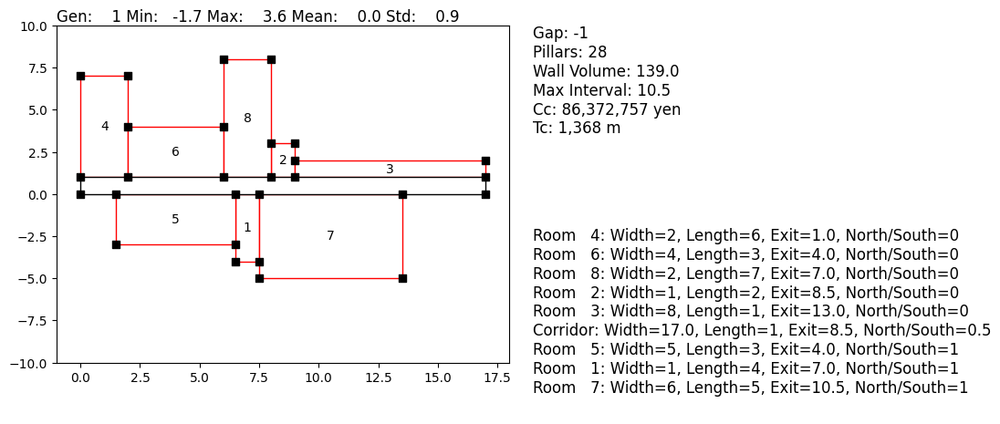

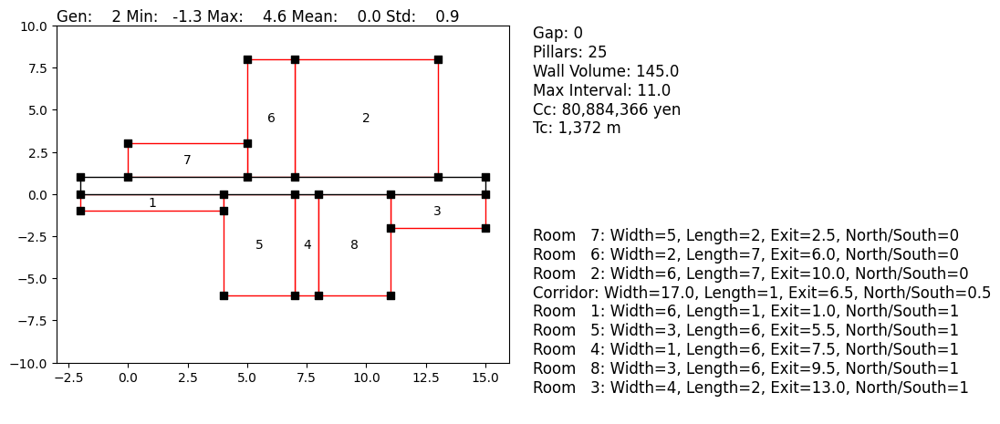

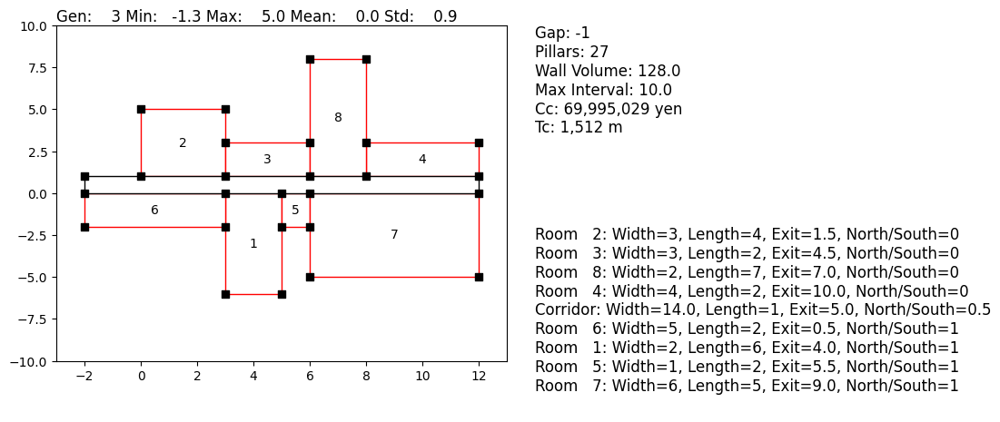

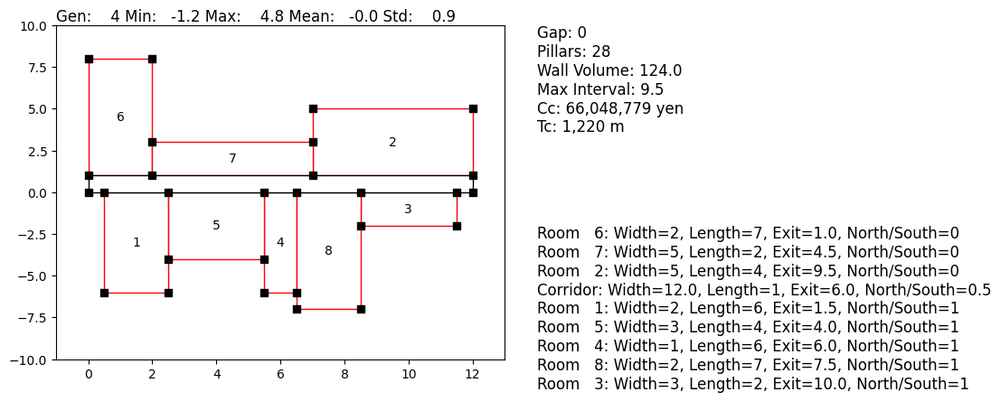

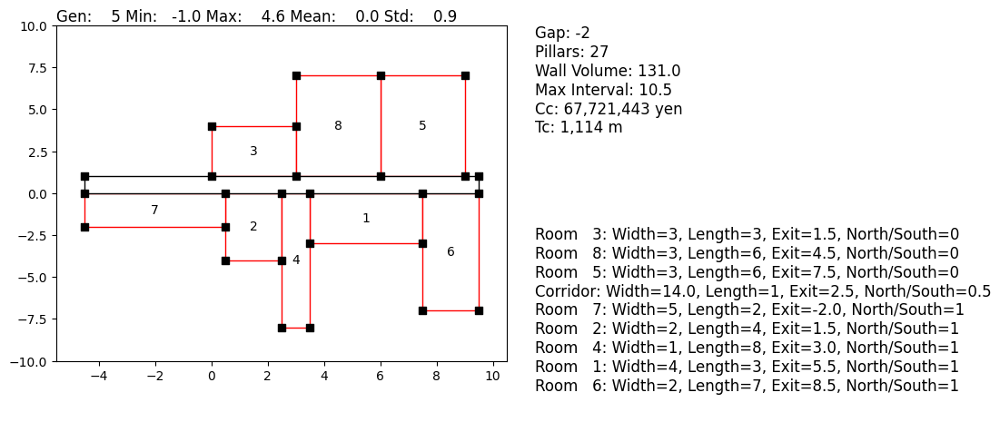

...

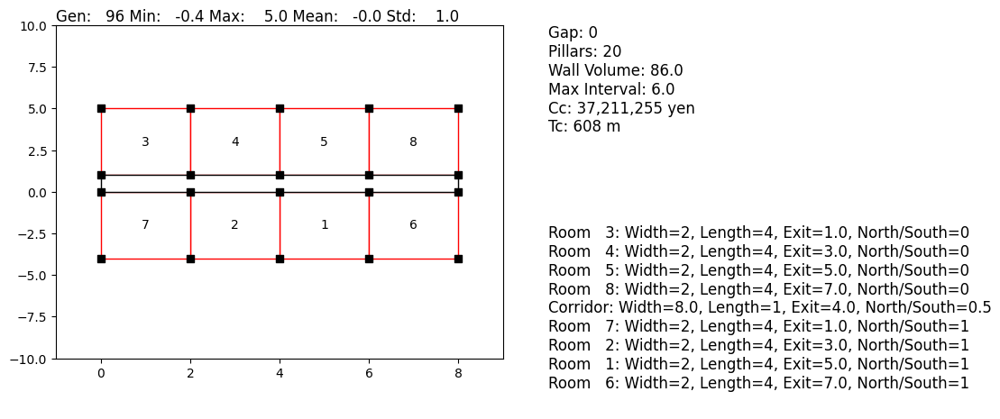

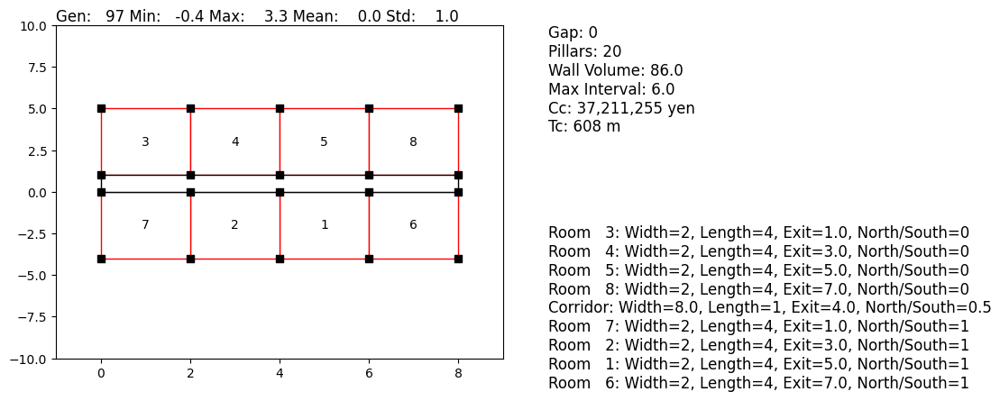

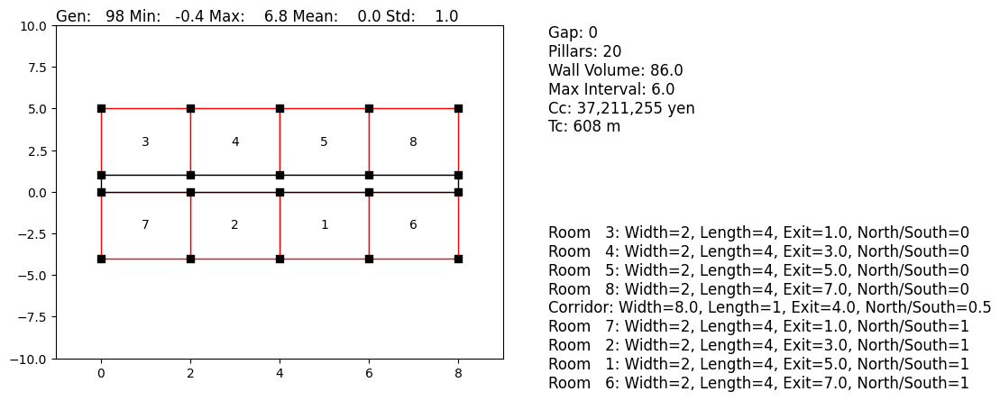

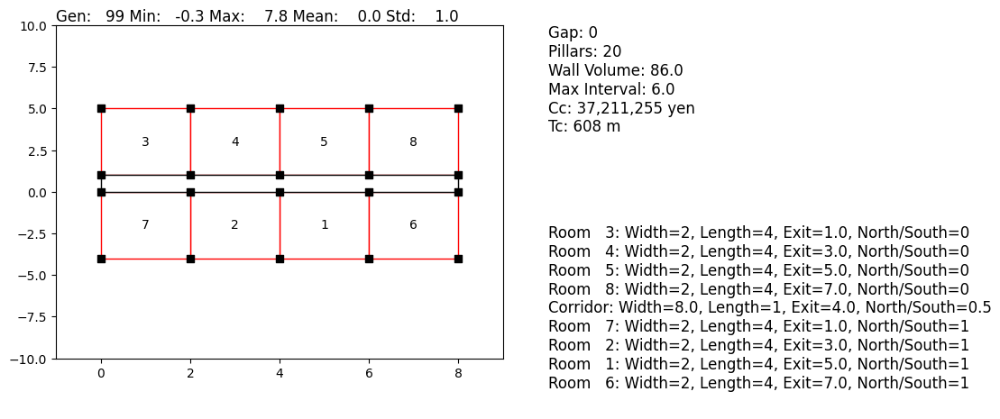

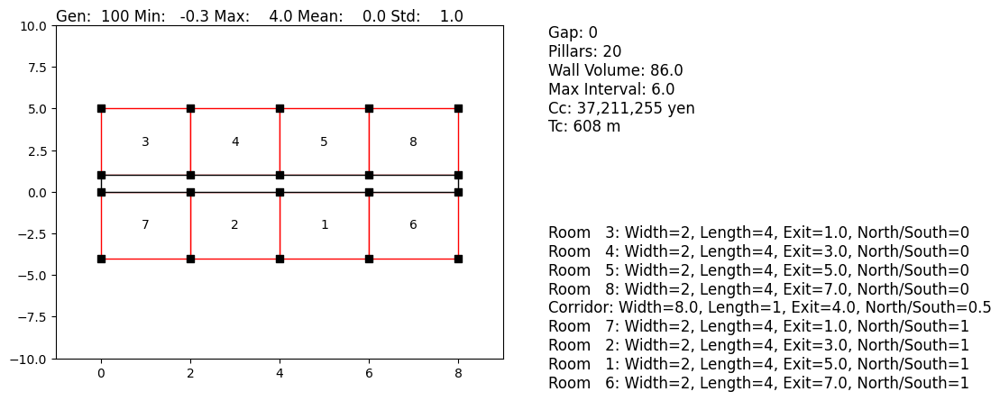

-- End of (successful) evolution --
Best individual is [3, 4, 5, 8, 0, 7, 2, 1, 6, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1], Fitness: -0.34551577491385743


In [13]:
if __name__ == "__main__":
    logs, best_fit = main()

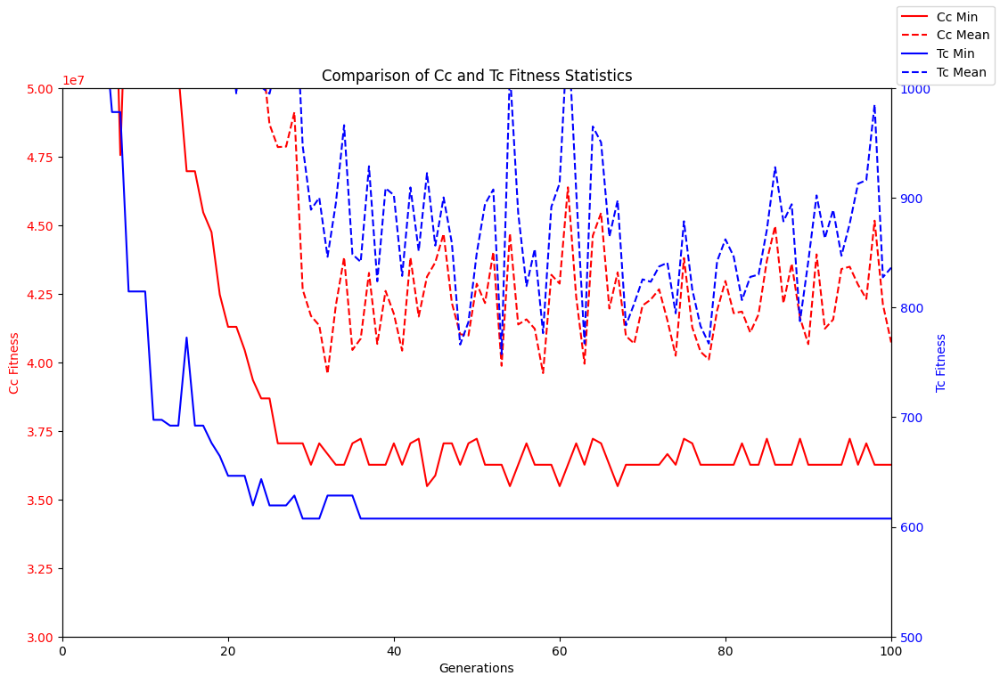

In [14]:
# Extracting data for plotting
Cc_maxs, Cc_mins, Cc_means, Cc_stds = zip(*[(log[0], log[1], log[2], log[3]) for log in logs])
Tc_maxs, Tc_mins, Tc_means, Tc_stds = zip(*[(log[4], log[5], log[6], log[7]) for log in logs])

fig, ax1 = plt.subplots(figsize=(12, 8))

# Plotting Cc statistics
ax1.plot(Cc_mins, 'r', label='Cc Min')
ax1.plot(Cc_means, 'r--', label='Cc Mean')
ax1.set_xlabel('Generations')
ax1.set_ylabel('Cc Fitness', color='r')
ax1.tick_params(axis='y', labelcolor='r')
ax1.set_ylim(30000000, 50000000)

# Plotting Tc statistics on a secondary y-axis
ax2 = ax1.twinx()
ax2.plot(Tc_mins, 'b', label='Tc Min')
ax2.plot(Tc_means, 'b--', label='Tc Mean')
ax2.set_ylabel('Tc Fitness', color='b')
ax2.tick_params(axis='y', labelcolor='b')
ax2.set_ylim(500, 1000)

ax1.set_xlim(0, len(logs)-1)

fig.legend(loc='upper right')
plt.title('Comparison of Cc and Tc Fitness Statistics')
plt.show()